You need to install midas to run depth inference: https://pypi.org/project/midas/

And download videos/background dataset

In [1]:
import cv2
import torch
import urllib.request
import matplotlib.pyplot as plt
import glob
from pathlib import Path

/home/ubuntu/miniconda3/envs/midas/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
videos_src = glob.glob('../videos/background/*') # Folder contains all of your videos

In [3]:
def get_one_frame(video):
    "get one np frame from a video"
    cap = cv2.VideoCapture(video)
    ret, frame = cap.read()
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    cap.release()
    return frame

In [4]:
## Lazy loading imgage to avoid overuse of memory in case to much videos
imgs_and_names = ((get_one_frame(video), (Path(video)).stem) for video in videos_src)

In [5]:
# Depth Deep Learning Model
model_type = "DPT_Large"     # MiDaS v3 - Large     (highest accuracy, slowest inference speed)
#model_type = "DPT_Hybrid"   # MiDaS v3 - Hybrid    (medium accuracy, medium inference speed)
#model_type = "MiDaS_small"  # MiDaS v2.1 - Small   (lowest accuracy, highest inference speed)

midas = torch.hub.load("intel-isl/MiDaS", model_type)

Using cache found in /home/ubuntu/.cache/torch/hub/intel-isl_MiDaS_master


In [6]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
midas.to(device)
midas.eval()

DPTDepthModel(
  (pretrained): Module(
    (model): VisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
        (norm): Identity()
      )
      (pos_drop): Dropout(p=0.0, inplace=False)
      (blocks): Sequential(
        (0): Block(
          (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): Linear(in_features=1024, out_features=3072, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=1024, out_features=1024, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (drop_path): Identity()
          (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=1024, out_features=4096, bias=True)
            (act): GELU()
            (drop1): Dropout(p=0.0, inplace=False)
            (fc2): Linear(in_features=4

In [7]:
midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")

if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
    transform = midas_transforms.dpt_transform
else:
    transform = midas_transforms.small_transform

Using cache found in /home/ubuntu/.cache/torch/hub/intel-isl_MiDaS_master


In [8]:
def get_depth_from_color(color_img, transform, model):
    """ Get depth image from midas DL model """
    input_batch = transform(img).to(device)
    with torch.no_grad():
        prediction = midas(input_batch)
        prediction = torch.nn.functional.interpolate(
            prediction.unsqueeze(1),
            size=img.shape[:2],
            mode="bicubic",
            align_corners=False,
        ).squeeze()

    output = prediction.cpu().numpy()
    output = (output/40*255).astype(int) # Here is to scale the range of value to approach 255
    return output

In [9]:
def masking_uninterested(depth_image, threshold_min = 60, threshold_max = 170):
    """ Masking the sky (and too closed object) by threshold based on empirical testing """
    threshold_min = 65
    threshold_max = 170
    depth_image[depth_image < threshold_min] = 0
    depth_image[depth_image > threshold_max] = 0
    return depth_image

In [10]:
dest_folder = Path("../depth_imgs")


In [11]:
if not dest_folder.exists(): dest_folder.mkdir()

/home/ubuntu/miniconda3/envs/midas/lib/python3.8/site-packages/torch/nn/functional.py:3060: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


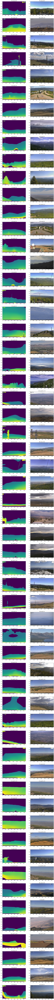

In [12]:
f, ax = plt.subplots(len(videos_src),2, figsize=(15,5*len(videos_src)))
dest_folder = Path("../depth_imgs")
if not dest_folder.exists(): dest_folder.mkdir()
    
for i, (img, name) in enumerate(imgs_and_names):
    depth_img = get_depth_from_color(img, transform, midas)
    depth_mask = masking_uninterested(depth_img)
    dest_path = dest_folder/f'{name}.jpg'
    cv2.imwrite(str(dest_path), depth_mask)
    ax[i,0].imshow(depth_mask)
    ax[i,0].set_title(name)
    
    ax[i,1].imshow(img)
    ax[i,1].set_title(name)